# 05 — Stage 3 Co-registration QA

Visualize the per-image phase-correlation shifts and peak-correlation values from
`cache/coregistration/{ObsId}.json`. The pipeline solves a rigid translation
`(dx_m, dy_m)` that brings HiRISE imagery onto the CTX grid — per CLAUDE.md §3.3
the expected magnitude is O(200 m), with larger shifts flagged as suspect.

Per the 2026-05-21 decision (AskUserQuestion answer: "No thresholds yet — collect
data first"), this notebook is the place where we eyeball the distribution and
decide where to set acceptance thresholds in a follow-up.

All real logic lives in `src/coregister.py`; this notebook only imports + plots.

In [1]:
import json
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from rasterio.plot import show as rio_show

REPO_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src import manifest as M
from src.config import load_config
from src.coregister import (
    COREGISTRATION_SUBDIR,
    _warp_hirise_to_ctx_grid,
    load_shift,
    select_fft_window,
)
from src.ctx_retrieve import CTX_WINDOWS_SUBDIR

FIG_DIR = REPO_ROOT / "reports" / "figures"
FIG_DIR.mkdir(parents=True, exist_ok=True)

cfg = load_config(REPO_ROOT / "config.yaml")
df = M.load_manifest(cfg.manifest_path)
df.head()

,ObsId,ProductId,LabelSource,BoulderLabel,TerrainNote,CenterLat,CenterLon_360,CenterLon_180,IncidenceAngle,EmissionAngle,CTX_TileName,BrowseURL,JP2_URL,LabelURL,QualityNote,OriginalNote
0,ESP_055714_2270,ESP_055714_2270_RED,spreadsheet,Boulder rich,plains,46.5607,19.6782,19.6782,NaN,NaN,E016_N44,https://www.uahirise.org/ESP_055714_2270,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,Clear Boulders,Plains. Low quality but can see many.
1,ESP_054857_2270,ESP_054857_2270_RED,spreadsheet,Boulder rich,plains,46.3880,14.9609,14.9609,NaN,NaN,E012_N44,https://www.uahirise.org/ESP_054857_2270,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,Clear Boulders,Plains. Deposit!
2,ESP_069669_2220,ESP_069669_2220_RED,spreadsheet,Boulder rich,plains,41.6915,0.8290,0.8290,NaN,NaN,E000_N40,https://www.uahirise.org/ESP_069669_2220,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,Clear Boulders,"Plains. Lots of good boulders, lots of buried ..."
3,ESP_057469_2215,ESP_057469_2215_RED,spreadsheet,Boulder rich,mesas,41.1772,0.0139,0.0139,NaN,NaN,E000_N40,https://www.uahirise.org/ESP_057469_2215,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,Clear Boulders,"Mesas. ** Mix of buried, small, large, clear b..."
4,ESP_071093_2210,ESP_071093_2210_RED,spreadsheet,Boulder rich,plains,40.6997,2.2546,2.2546,NaN,NaN,E000_N40,https://www.uahirise.org/ESP_071093_2210,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,https://hirise.lpl.arizona.edu/PDS/RDR/ESP/ORB...,Clear Boulders,Plains. Excellent boulders. Deposit!


## Per-image shift summary

One row per ObsId with a cached Stage 3 result. The columns are:
- `shift_m` magnitude, dx, dy
- `peak_correlation` (Pearson, after applying the solved shift)
- `fft_window_px` (size of the FFT sub-window — power of 2)
- `hirise_coverage` (Stage 2 mask coverage of the polygon-bbox window)

In [2]:
rows = []
for obs in df["ObsId"]:
    coreg = load_shift(obs, cfg.cache_dir)
    stage2_sidecar = cfg.cache_dir / CTX_WINDOWS_SUBDIR / f"{obs}.json"
    if coreg is None:
        continue
    cov = None
    if stage2_sidecar.exists():
        cov = json.loads(stage2_sidecar.read_text(encoding="utf-8")).get("hirise_coverage_fraction")
    rows.append({
        "ObsId": obs,
        "label": df.set_index("ObsId").loc[obs, "BoulderLabel"],
        "shift_m": coreg["shift_m"]["magnitude"],
        "dx_m": coreg["shift_m"]["dx"],
        "dy_m": coreg["shift_m"]["dy"],
        "peak": coreg["peak_correlation"],
        "fft_px": coreg["fft_window"]["size_px"],
        "hirise_coverage": cov,
    })
summary = pd.DataFrame(rows).set_index("ObsId").sort_values("shift_m")
summary

,label,shift_m,dx_m,dy_m,peak,fft_px,hirise_coverage
ObsId,,,,,,,
ESP_054857_2270,Boulder rich,118.006020,-1.249994,-117.999400,0.630957,256,0.538544
ESP_047976_2020,Boulder rich,125.520768,-8.249958,-125.249357,0.713709,256,0.543993
ESP_075577_2105,Boulder poor,160.330869,29.999847,-157.499196,0.686268,256,0.577653
ESP_056165_2200,Boulder poor,164.537909,-62.999680,-151.999222,0.281660,256,0.668612
ESP_039820_1750,unknown,178.920855,101.999478,-146.999248,0.680477,256,0.579386
ESP_065711_1545,unknown,223.428939,38.999802,-219.998877,0.701863,256,0.428689
ESP_055714_2270,Boulder rich,240.781995,29.249850,-238.998777,0.599243,256,0.603148
ESP_071093_2210,Boulder rich,246.985578,-15.499920,-246.498738,0.773468,256,0.617752
ESP_069669_2220,Boulder rich,272.576124,122.499375,-243.498761,0.875339,256,0.597069


## Shift magnitude vs peak correlation

CLAUDE.md §3.3 expects |shift| ~ O(200 m). Outliers in km territory point at
remaining CRS handling issues; outliers with very low peak correlation indicate
weakly textured ground (bland plains) where phase correlation isn't reliable.

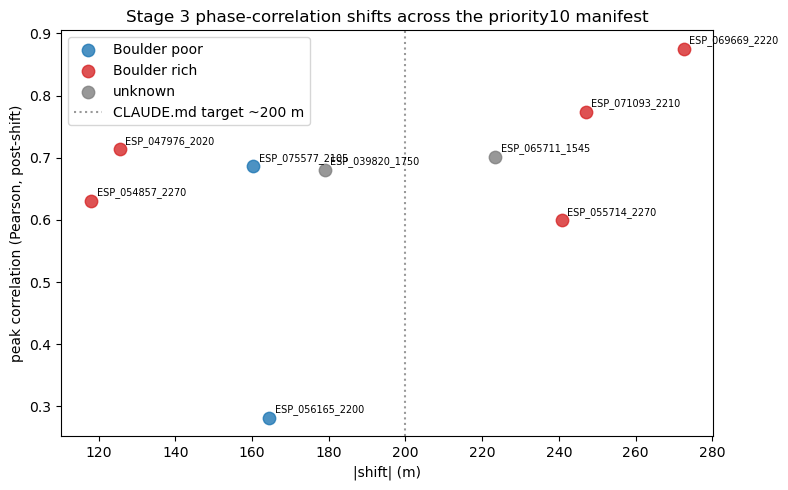

In [3]:
fig, ax = plt.subplots(figsize=(8, 5))
colors = {"Boulder rich": "tab:red", "Boulder poor": "tab:blue", "unknown": "tab:gray"}
for label, sub in summary.groupby("label"):
    ax.scatter(sub["shift_m"], sub["peak"], c=colors.get(label, "k"),
               s=80, alpha=0.8, label=label)
    for obs, row in sub.iterrows():
        ax.annotate(obs, (row["shift_m"], row["peak"]),
                    fontsize=7, xytext=(4, 4), textcoords="offset points")
ax.axvline(200, color="k", linestyle=":", alpha=0.4, label="CLAUDE.md target ~200 m")
ax.set_xlabel("|shift| (m)")
ax.set_ylabel("peak correlation (Pearson, post-shift)")
ax.set_title("Stage 3 phase-correlation shifts across the priority10 manifest")
ax.legend()
fig.tight_layout()
fig.savefig(FIG_DIR / "05_shift_vs_peak.png", dpi=110)
plt.show()

## Per-image before/after overlay

For each ObsId, overlay the FFT sub-window from HiRISE-on-CTX-grid against the
co-located CTX patch. The right panel shows the same overlay after applying the
solved (dy, dx) shift — visual confirmation that the shift actually improves
alignment.

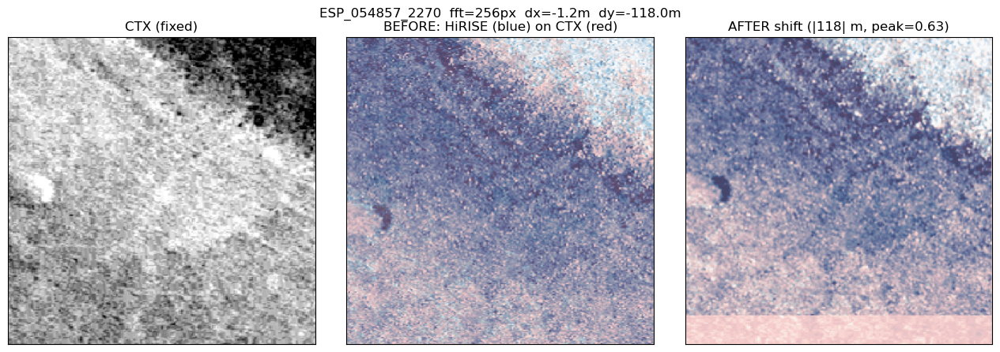

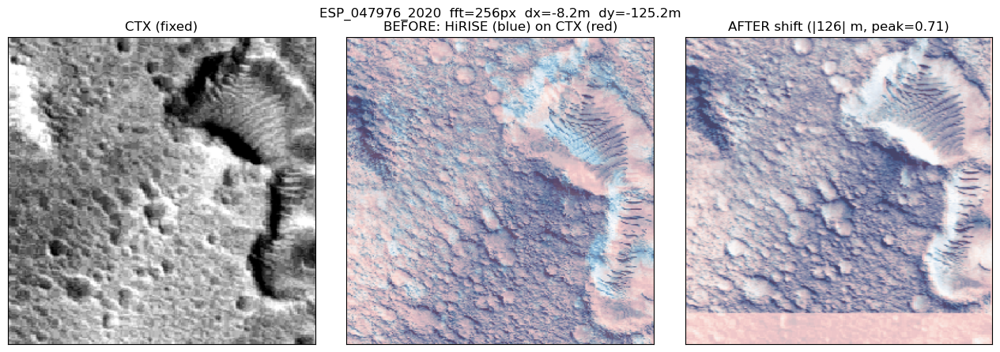

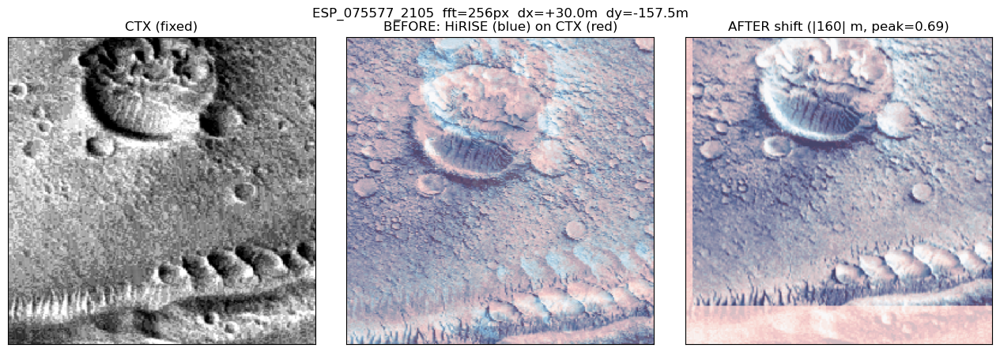

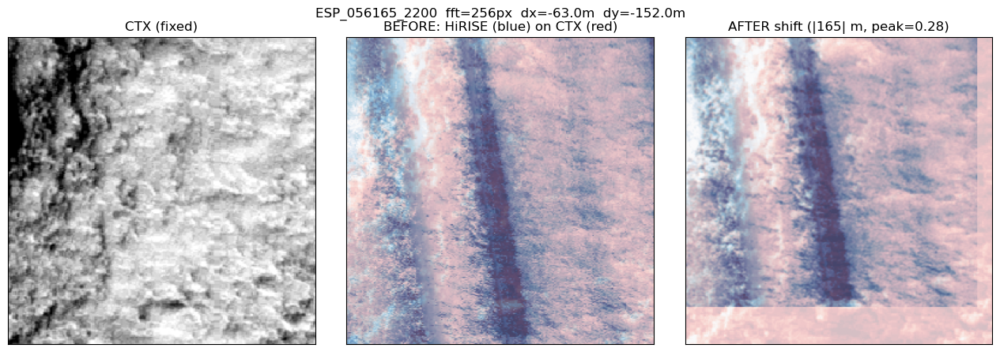

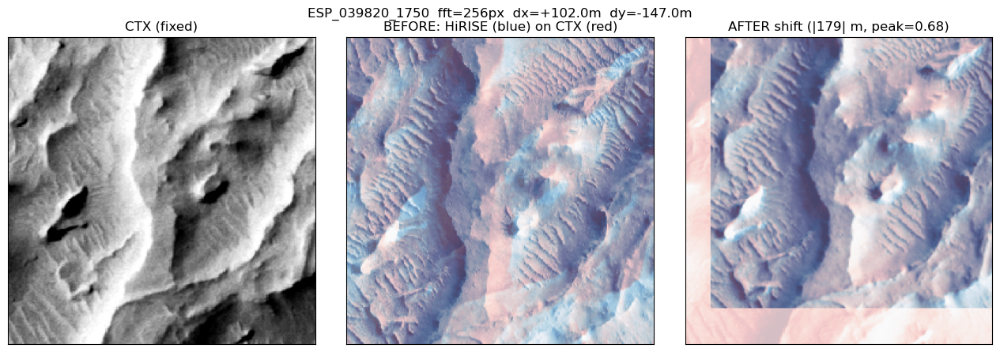

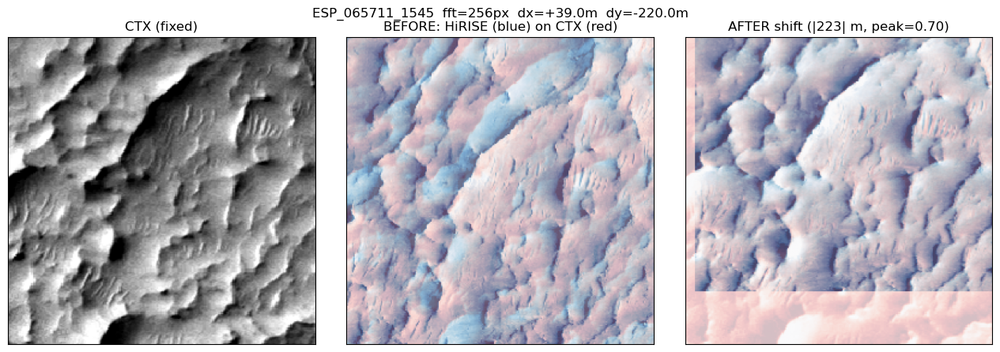

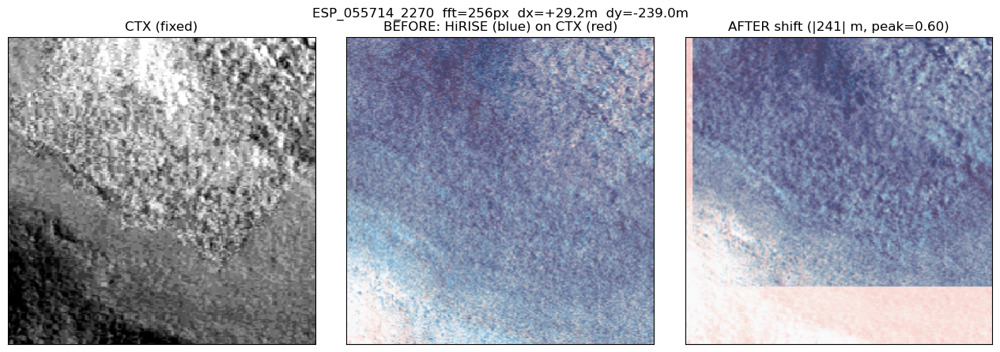

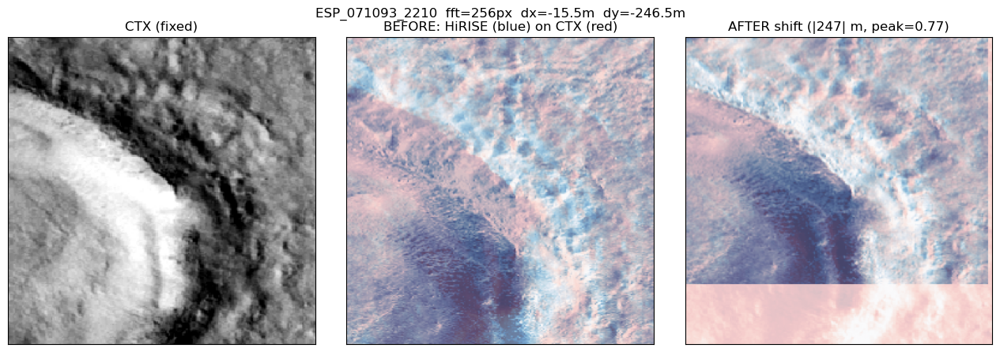

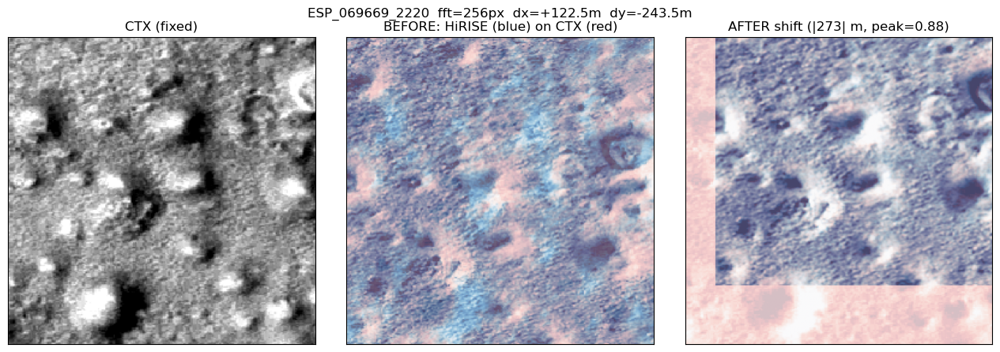

In [4]:
from scipy.ndimage import shift as nd_shift

def plot_one(obs_id: str) -> Path:
    """Render the FFT-sub-window before/after the solved shift; return the saved fig path."""
    coreg = load_shift(obs_id, cfg.cache_dir)
    if coreg is None:
        print(f"{obs_id}: no Stage 3 cache")
        return None
    fft = coreg["fft_window"]
    size = fft["size_px"]
    r0, c0 = fft["row_off"], fft["col_off"]
    dy, dx = coreg["shift_px"]["dy"], coreg["shift_px"]["dx"]

    ctx_tif = cfg.cache_dir / CTX_WINDOWS_SUBDIR / f"{obs_id}.tif"
    with rasterio.open(ctx_tif) as ds:
        ctx = ds.read(1).astype(np.float32)
    row = df.set_index("ObsId").loc[obs_id]
    hi, _, _ = _warp_hirise_to_ctx_grid(
        obs_id, jp2_url=str(row["JP2_URL"]), cache_dir=cfg.cache_dir, ctx_window_tif=ctx_tif,
    )
    ctx_sub = ctx[r0:r0+size, c0:c0+size]
    hi_sub = hi[r0:r0+size, c0:c0+size]
    hi_shifted = nd_shift(hi_sub, shift=(dy, dx), order=1, mode="constant", cval=0.0)

    def norm(a):
        a = a.astype(np.float32)
        lo, hi_ = np.percentile(a[a > 0], (2, 98)) if (a > 0).any() else (0, 1)
        return np.clip((a - lo) / max(hi_ - lo, 1e-9), 0, 1)

    fig, axes = plt.subplots(1, 3, figsize=(13, 4.5))
    axes[0].imshow(norm(ctx_sub), cmap="gray")
    axes[0].set_title("CTX (fixed)")
    axes[1].imshow(norm(ctx_sub), cmap="Reds", alpha=0.6)
    axes[1].imshow(norm(hi_sub), cmap="Blues", alpha=0.6)
    axes[1].set_title("BEFORE: HiRISE (blue) on CTX (red)")
    axes[2].imshow(norm(ctx_sub), cmap="Reds", alpha=0.6)
    axes[2].imshow(norm(hi_shifted), cmap="Blues", alpha=0.6)
    sm = coreg["shift_m"]
    axes[2].set_title(
        f"AFTER shift (|{sm['magnitude']:.0f}| m, peak={coreg['peak_correlation']:.2f})"
    )
    for ax in axes:
        ax.set_xticks([]); ax.set_yticks([])
    fig.suptitle(f"{obs_id}  fft={size}px  dx={sm['dx']:+.1f}m  dy={sm['dy']:+.1f}m")
    fig.tight_layout()
    out_path = FIG_DIR / f"05_coreg_{obs_id}.png"
    fig.savefig(out_path, dpi=110)
    plt.show()
    return out_path

for obs in summary.index:
    plot_one(obs)

## Per-image feature crosshairs (BEFORE / AFTER shift)

Hard to read sub-pixel alignment from the red/blue overlays alone, especially on
boulder-poor / weakly-textured scenes (ESP_056165_2200, peak=0.28). This second
visualization pins down ~6 distinctive features detected in the CTX sub-window and
plots crosshairs at the SAME pixel coords on all three panels.

The eye should read it as:
- **CTX panel:** crosshairs ON the bright features (definition of correct).
- **BEFORE panel:** the same screen coords miss the corresponding HiRISE features
  by the magnitude of the un-corrected offset.
- **AFTER panel:** the same screen coords land back ON the corresponding HiRISE
  features — confirming that the rigid translation does what we measured.

Bland scenes still get crosshairs at *something* — `peak_local_max` returns the
strongest local extrema even when those are dim. ESP_056165_2200 is the cleanest
test of this: low peak correlation, but the markers should still snap into place.


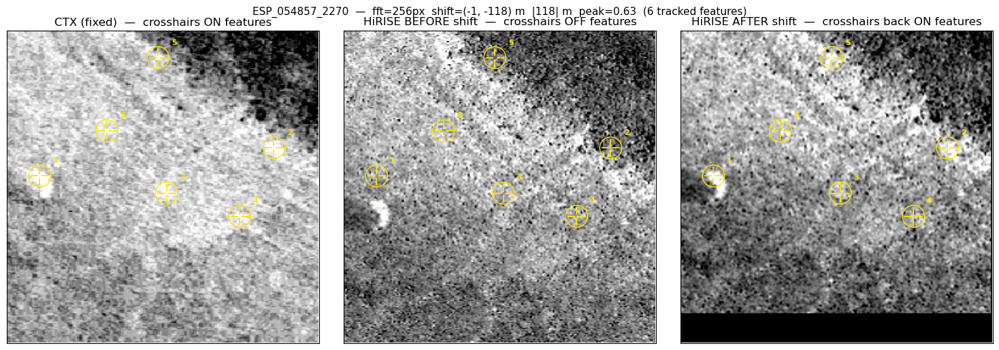

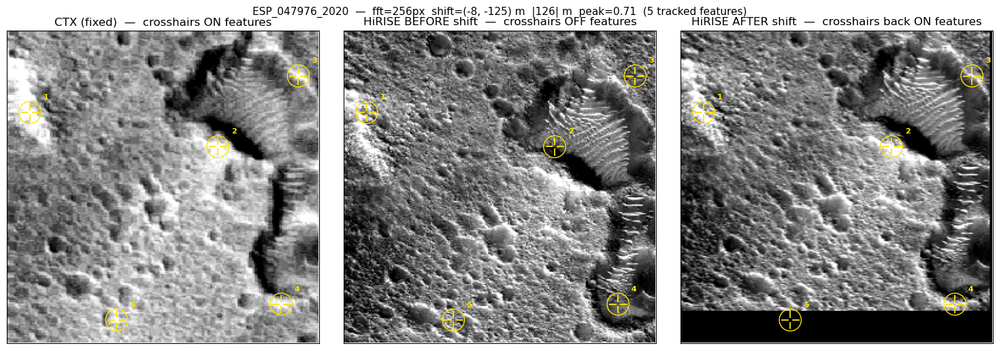

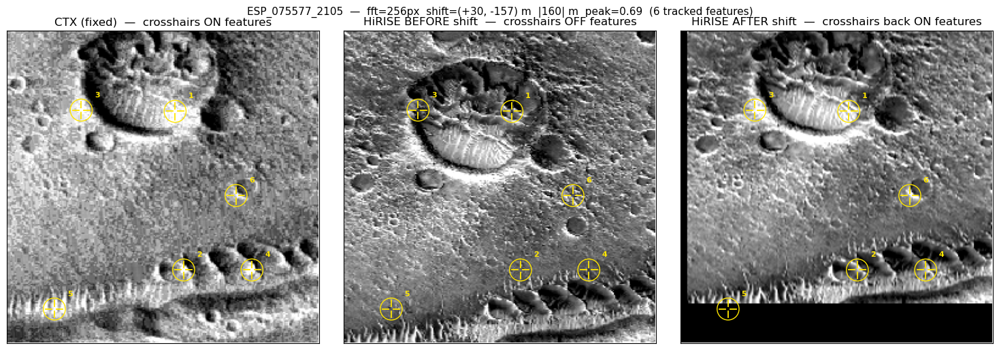

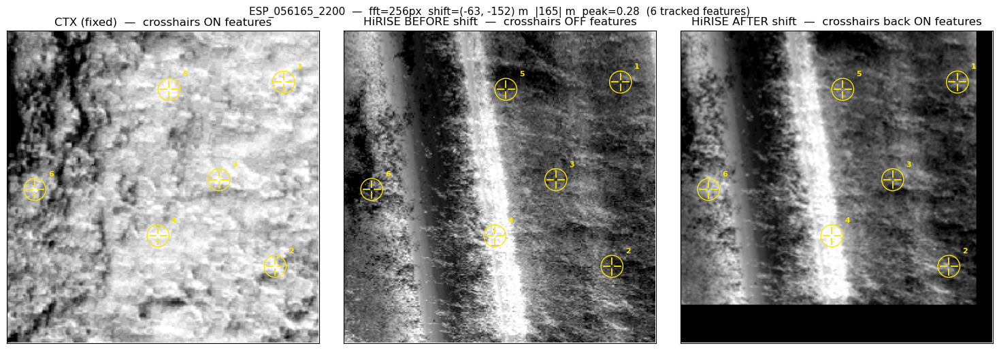

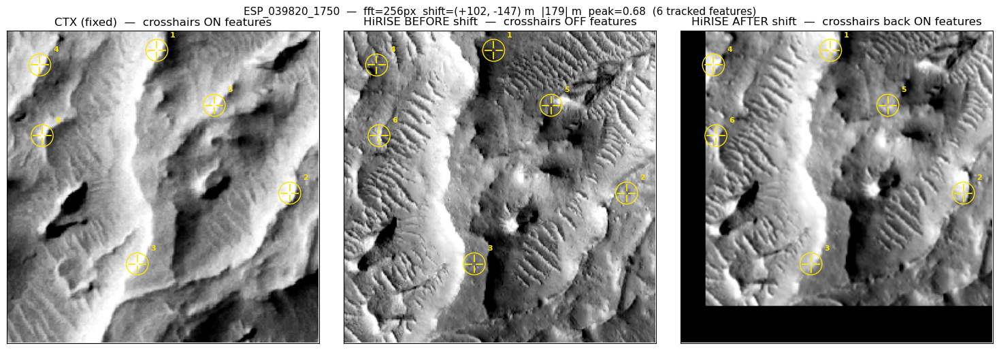

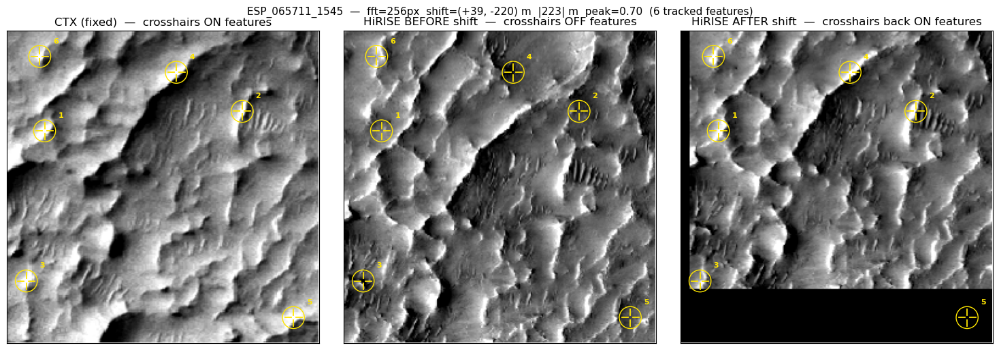

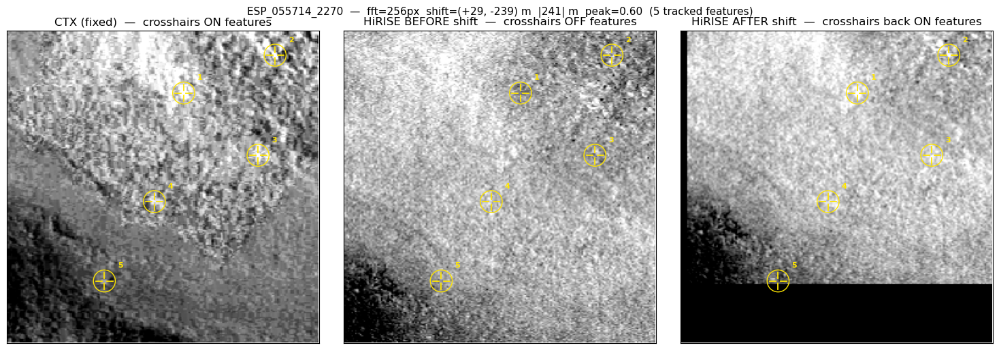

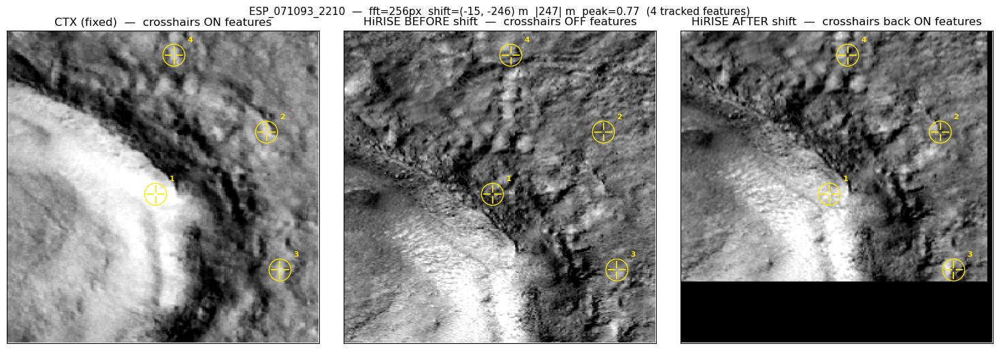

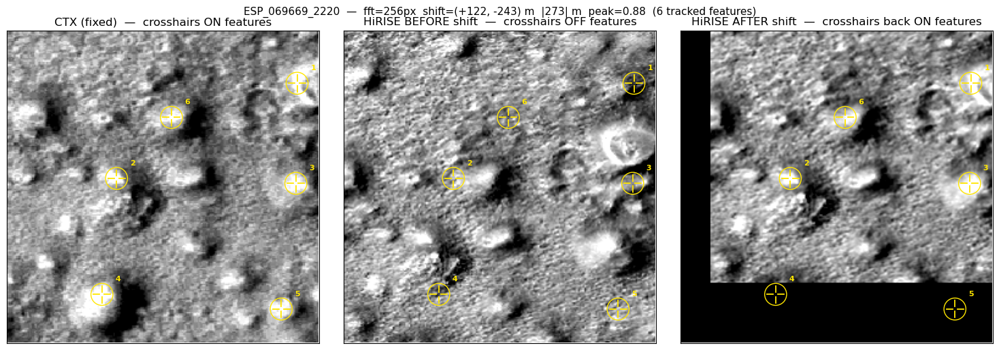

In [5]:
from src.coregister import find_tracking_features


def plot_one_with_markers(obs_id: str) -> Path | None:
    """Render CTX | BEFORE | AFTER panels with identical feature crosshairs."""
    coreg = load_shift(obs_id, cfg.cache_dir)
    if coreg is None:
        return None
    fft = coreg["fft_window"]
    size = fft["size_px"]
    r0, c0 = fft["row_off"], fft["col_off"]
    dy_px, dx_px = coreg["shift_px"]["dy"], coreg["shift_px"]["dx"]

    ctx_tif = cfg.cache_dir / CTX_WINDOWS_SUBDIR / f"{obs_id}.tif"
    with rasterio.open(ctx_tif) as ds:
        ctx = ds.read(1).astype(np.float32)
    row = df.set_index("ObsId").loc[obs_id]
    hi, _, _ = _warp_hirise_to_ctx_grid(
        obs_id, jp2_url=str(row["JP2_URL"]), cache_dir=cfg.cache_dir, ctx_window_tif=ctx_tif,
    )
    ctx_sub = ctx[r0:r0+size, c0:c0+size]
    hi_sub = hi[r0:r0+size, c0:c0+size]
    hi_shifted = nd_shift(hi_sub, shift=(dy_px, dx_px), order=1, mode="constant", cval=0.0)

    # Find the marker coordinates on the CTX sub-window once; the same coords are
    # reused on the HiRISE panels so any misalignment is immediately legible.
    feats = find_tracking_features(ctx_sub, n_features=6, min_distance=size // 6, edge_margin=size // 16)

    def norm(a):
        a = a.astype(np.float32)
        if (a > 0).any():
            lo, hi_ = np.percentile(a[a > 0], (2, 98))
        else:
            lo, hi_ = 0.0, 1.0
        return np.clip((a - lo) / max(hi_ - lo, 1e-9), 0, 1)

    def draw_markers(ax, coords, color, label_offset=True):
        for i, (r, c) in enumerate(coords):
            # Crosshair: short tick marks + small circle, leaving the central feature visible.
            ax.plot([c - 7, c - 2], [r, r], color=color, lw=1.3)
            ax.plot([c + 2, c + 7], [r, r], color=color, lw=1.3)
            ax.plot([c, c], [r - 7, r - 2], color=color, lw=1.3)
            ax.plot([c, c], [r + 2, r + 7], color=color, lw=1.3)
            ax.add_patch(plt.Circle((c, r), radius=9, edgecolor=color, facecolor="none", lw=1.0))
            if label_offset:
                ax.text(c + 11, r - 11, str(i + 1), color=color, fontsize=8,
                        weight="bold", path_effects=[])

    fig, axes = plt.subplots(1, 3, figsize=(15, 5.2))
    axes[0].imshow(norm(ctx_sub), cmap="gray")
    axes[0].set_title("CTX (fixed)  —  crosshairs ON features")
    draw_markers(axes[0], feats, color="#ffe600")

    axes[1].imshow(norm(hi_sub), cmap="gray")
    axes[1].set_title("HiRISE BEFORE shift  —  crosshairs OFF features")
    draw_markers(axes[1], feats, color="#ffe600")

    axes[2].imshow(norm(hi_shifted), cmap="gray")
    axes[2].set_title("HiRISE AFTER shift  —  crosshairs back ON features")
    draw_markers(axes[2], feats, color="#ffe600")

    for ax in axes:
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlim(0, size); ax.set_ylim(size, 0)

    sm = coreg["shift_m"]
    fig.suptitle(
        f"{obs_id}  —  fft={size}px  shift=({sm['dx']:+.0f}, {sm['dy']:+.0f}) m  "
        f"|{sm['magnitude']:.0f}| m  peak={coreg['peak_correlation']:.2f}  "
        f"({len(feats)} tracked features)",
        fontsize=11,
    )
    fig.tight_layout()
    out_path = FIG_DIR / f"05_markers_{obs_id}.png"
    fig.savefig(out_path, dpi=110)
    plt.show()
    return out_path


for obs in summary.index:
    plot_one_with_markers(obs)


## Decision space

From the distribution above, the next pass should pin down:

- **A `flag` threshold on `|shift|`** — likely 500 m (well above the CTX-mosaic
  ~200 m baseline but below km-scale CRS-bug shifts).
- **A `flag` threshold on `peak_correlation`** — likely 0.2 or so for bland-plains
  detection.
- **Whether to apply the shift at Stage 4 or only record it as provenance.** Per
  CLAUDE.md, Stage 4 must still work on nominal geolocation — so applying the shift
  is optional and gated on `flag == False`.

Update `DECISIONS.md` once the thresholds are chosen.